In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import os
from tqdm import tqdm

from scripts.imagedata import ImageData
from scripts.model import Net
from scripts.config import device

import torch
import torch.nn as nn

from IPython.display import clear_output
from skimage.transform import resize

path_to_data = 'imgs/fits/all'

new_shape = (256, 512)
signs, filaments = [], []
for filename in os.listdir(path_to_data)[:7]:
    with fits.open(os.path.join(path_to_data, filename)) as hduls:
        sign = np.array(hduls[0].data == 7)[2:, 2:-10]
        filament = np.array(hduls[0].data == 8)
    sign = resize(sign.astype(float), new_shape, anti_aliasing=True)
    filament = resize(filament.astype(float), new_shape, anti_aliasing=True)
    sign = 2 * (sign - np.min(sign)) / (np.max(sign) - np.min(sign)) - 1
    filament = 2 * (filament - np.min(filament)) / (np.max(filament) - np.min(filament)) - 1
    signs.append(sign)
    filaments.append(ImageData(1-filament, 'img'))

In [2]:
class MSENet(nn.Module):
    def __init__(self, img, mode, arch, lr, weight_decay=1e-3):
        super(MSENet, self).__init__()
        self.net = nn.Sequential()
        for i in range(len(arch)-1):
            self.net.add_module(f'linear_{i}', nn.Linear(arch[i], arch[i+1]))
            # self.net.add_module(f'elu_{i}' if i != len(arch)-2 else f'tanh_{i}',
            #                     nn.ELU() if i != len(arch)-2 else nn.Tanh())
            self.net.add_module(f'tanh_{i}', nn.Tanh())
        self.arch = arch
        self.img = torch.FloatTensor(img.img_array)
        self.data = img.data_3d if mode == '3d' else img.data_2d
        self.lr = lr
        self.weight_decay = weight_decay
        self.optimizer = torch.optim.Adam(self.parameters(), lr=self.lr, weight_decay=self.weight_decay)
        self.loss_dict = []

    def forward(self, x):
        output = self.net(x)
        return output
    
    def compute_loss(self, prediction):
        mse = nn.MSELoss()
        loss = mse(prediction.squeeze(), self.img.flatten().to(device))
        self.loss_dict.append(loss.item())
        return loss
    
    def train(self, num_epochs=1000, need_plot=True, need_save=True):
        num_epochs = int(num_epochs)
        for epoch in tqdm(range(num_epochs), desc='Epoch'):
            self.optimizer.zero_grad()
            prediction = self.forward(self.data.to(device))
            loss = self.compute_loss(prediction)
            loss.backward()
            self.optimizer.step()
            if need_plot:
                if (epoch+1) % 1000 == 0 or epoch == num_epochs-1:
                    clear_output(wait=True)
                    fig = plt.figure(figsize=(20, 10))
                    gs = fig.add_gridspec(2, 2)
                    ax1 = fig.add_subplot(gs[1, :])
                    ax1.plot(self.loss_dict)
                    ax1.set_title('Loss')
                    ax1.set_xlabel('Epoch')
                    ax2 = fig.add_subplot(gs[0, 0])
                    ax2.imshow(prediction.view(new_shape).cpu().detach(), cmap='PuOr')
                    ax2.set_title('prediction')
                    ax3 = fig.add_subplot(gs[0, 1])
                    ax3.imshow(self.img, cmap='PuOr')
                    ax3.set_title('target')
                    fig.suptitle(f'Epoch: {epoch+1}/{num_epochs}\nLoss: {loss.item():.4f}, lr: {self.lr}, weight_decay: {self.weight_decay}\nArchitecure: {self.arch}')
                    plt.tight_layout()
                    plt.show()


# FITS

unzip

In [16]:
# extract .gz
import gzip
import shutil


for filename in os.listdir(path_to_data):
    if filename.endswith('.gz'):
        with gzip.open(os.path.join(path_to_data, filename), 'rb') as f_in:
            with open(os.path.join(path_to_data, filename[:-3]), 'wb') as f_out:
                shutil.copyfileobj(f_in, f_out)
    

delete .gz

In [17]:
# delete .gz
for filename in os.listdir(path_to_data):
    if filename.endswith('.gz'):
        os.remove(os.path.join(path_to_data, filename))

In [4]:
print(len(os.listdir(path_to_data)))

732


preprocess

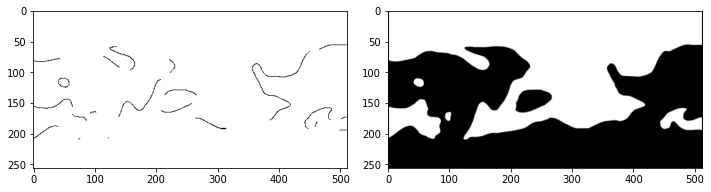

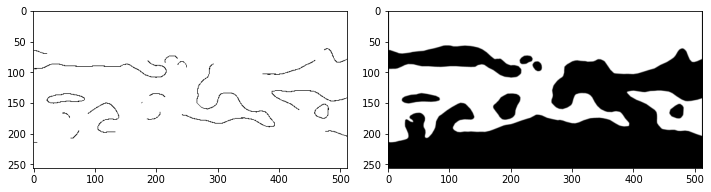

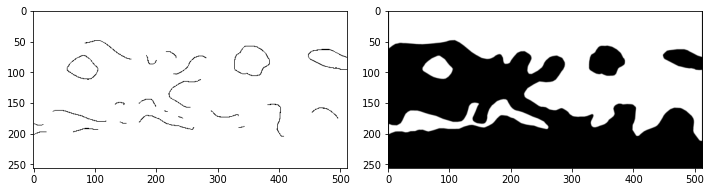

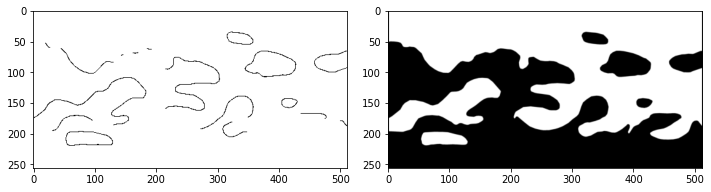

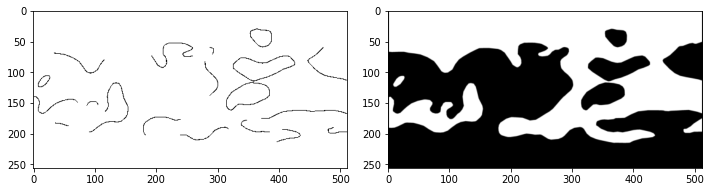

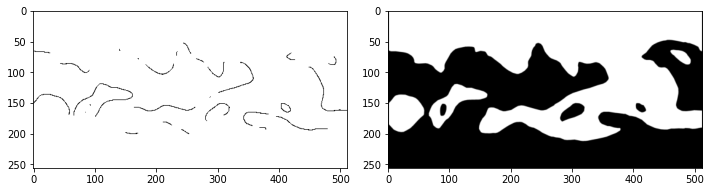

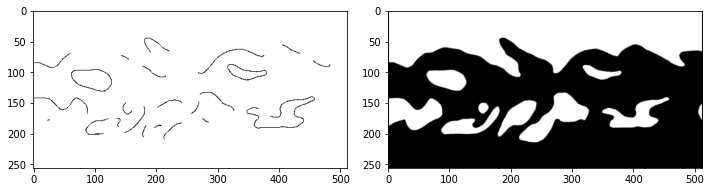

In [12]:
new_shape = (256, 512)

x_data, y_data = [], []

for filename in os.listdir(path_to_data)[:7]:
    # hduls = fits.open(os.path.join(path_to_data, filename))
    with fits.open(os.path.join(path_to_data, filename)) as hduls:
        x = hduls[0].data == 8
        y = hduls[0].data == 7

    xx = resize(x.astype(float), new_shape, anti_aliasing=True)
    yy = resize(y.astype(float), new_shape, anti_aliasing=True)

    xx = (1 - (xx - np.min(xx)) / (np.max(xx) - np.min(xx))) > 0.5
    yy = (yy - np.min(yy)) / (np.max(yy) - np.min(yy))
    plt.figure(figsize=(10, 5))

    # plt.subplot(2, 2, 1)
    # plt.imshow(x, cmap='gray')
    # plt.title(filename)

    # plt.subplot(2, 2, 2)
    # plt.imshow(y, cmap='gray')
    # plt.title(filename)

    plt.subplot(1, 2, 1)
    plt.imshow(xx, cmap='gray')

    plt.subplot(1, 2, 2)
    plt.imshow(yy, cmap='gray')

    plt.tight_layout()
    plt.show()

    x_data.append(xx)
    y_data.append(yy)

# Test 256

In [5]:
path_to_save = 'Tests/Fits_256'
num_tries = 9
num_epochs = 2e+4
os.makedirs(path_to_save, exist_ok=True)

In [6]:
for img_num, (x, y) in enumerate(zip(x_data, y_data)):
    cur_path = os.path.join(path_to_save, f'img_{img_num+1}')
    os.makedirs(cur_path, exist_ok=True)
    for i in range(num_tries):
        cur_path_try = os.path.join(cur_path, f'try_{i+1}')
        os.makedirs(cur_path_try, exist_ok=True)
        img_data = ImageData(x, 'img')
        model = Net(image_list=[img_data], lr=1e-3)
        model.to(device)
        model.start_training(num_epochs=num_epochs, my_weight=0.1, need_save=False, need_plot=False)
        prediction_list = model.test_model()
        prediction = prediction_list[0]
        torch.save(model.state_dict(), os.path.join(cur_path_try,f'model_{img_num+1}_{i+1}.pth'))
        plt.figure(figsize=(20, 10))
        plt.subplot(1, 3, 1)
        plt.imshow(x, cmap='PuOr')
        plt.title('input')
        plt.subplot(1, 3, 2)
        plt.imshow(prediction.view(new_shape), cmap='PuOr')
        plt.title('prediction')
        plt.subplot(1, 3, 3)
        plt.imshow(y, cmap='PuOr')
        plt.title('target')
        plt.tight_layout()
        # add white background
        plt.savefig(os.path.join(cur_path_try, f'result_{img_num+1}_{i+1}.png'), bbox_inches='tight', pad_inches=0, facecolor='white')
        plt.close()


In [8]:
for img_num, (x, y) in enumerate(zip(x_data, y_data)):
    cur_path = os.path.join(path_to_save, f'img_{200+img_num+1}')
    os.makedirs(cur_path, exist_ok=True)
    for i in range(num_tries):
        cur_path_try = os.path.join(cur_path, f'try_{200+i+1}')
        os.makedirs(cur_path_try, exist_ok=True)
        img_data = ImageData(x, 'img')
        model = Net(image_list=[img_data], lr=1e-3)
        model.to(device)
        model.start_training(num_epochs=num_epochs, my_weight=0.1, need_save=False, need_plot=False)
        prediction_list = model.test_model()
        prediction = prediction_list[0]
        torch.save(model.state_dict(), os.path.join(cur_path_try,f'model_{200+img_num+1}_{200+i+1}.pth'))
        plt.figure(figsize=(20, 10))
        plt.subplot(1, 3, 1)
        plt.imshow(x, cmap='PuOr')
        plt.title('input')
        plt.subplot(1, 3, 2)
        plt.imshow(prediction.view(new_shape), cmap='PuOr')
        plt.title('prediction')
        plt.subplot(1, 3, 3)
        plt.imshow(y, cmap='PuOr')
        plt.title('target')
        plt.tight_layout()
        # add white background
        plt.savefig(os.path.join(cur_path_try, f'result_{200+img_num+1}_{i+1}.png'), bbox_inches='tight', pad_inches=0, facecolor='white')
        plt.close()


# Test 512

In [10]:
path_to_save = 'Tests/Fits_512'

In [13]:
for img_num, (x, y) in tqdm(enumerate(zip(x_data, y_data)), desc=f'Map {img_num+1}/{len(x_data)}'):
    cur_path = os.path.join(path_to_save, f'img_{img_num+1}')
    os.makedirs(cur_path, exist_ok=True)
    for i in range(num_tries):
        img_data = ImageData(x, 'img')
        model = Net(image_list=[img_data], lr=1e-3)
        model.to(device)
        model.start_training(num_epochs=num_epochs, my_weight=0.1, need_save=False, need_plot=False)
        prediction_list = model.test_model()
        prediction = prediction_list[0]
        torch.save(model.state_dict(), os.path.join(cur_path,f'model_{img_num+1}_{i+1}.pth'))
        plt.figure(figsize=(20, 10))
        plt.subplot(1, 3, 1)
        plt.imshow(x, cmap='PuOr')
        plt.title('input')
        plt.subplot(1, 3, 2)
        plt.imshow(prediction.view(new_shape), cmap='PuOr')
        plt.title('prediction')
        plt.subplot(1, 3, 3)
        plt.imshow(y, cmap='PuOr')
        plt.title('target')
        plt.tight_layout()
        # add white background
        plt.savefig(os.path.join(cur_path, f'result_{img_num+1}_{i+1}.png'), bbox_inches='tight', pad_inches=0, facecolor='white')
        plt.close()


Map 1/7: 2it [1:04:43, 1941.88s/it]


KeyboardInterrupt: 

# Using previous map

### I

In [30]:
new_shape = (256, 512)
data = []
for filename in os.listdir(path_to_data)[:7]:
    with fits.open(os.path.join(path_to_data, filename)) as hduls:
        img = (hduls[0].data == 9) + (hduls[0].data == 8)
        img = resize(img.astype(float), new_shape, anti_aliasing=True)
        img = (img - np.min(img)) / (np.max(img) - np.min(img))
        data.append(1-img)

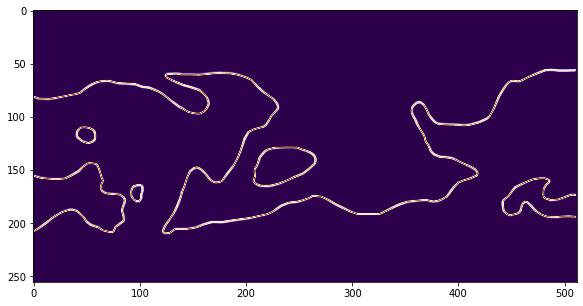

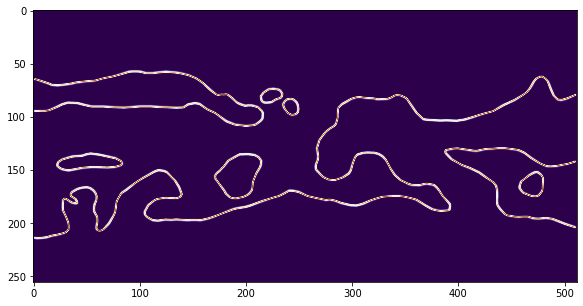

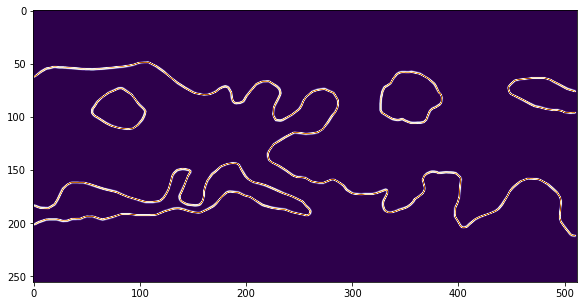

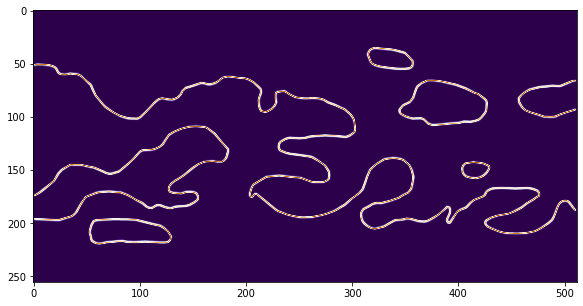

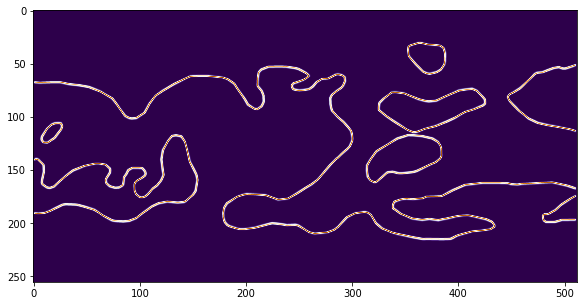

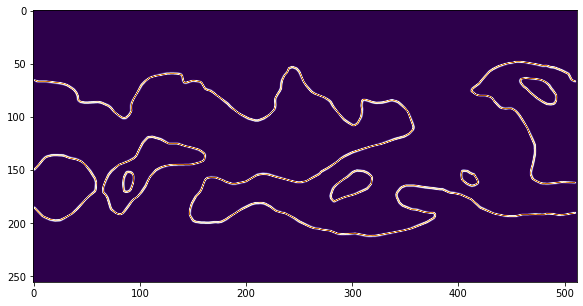

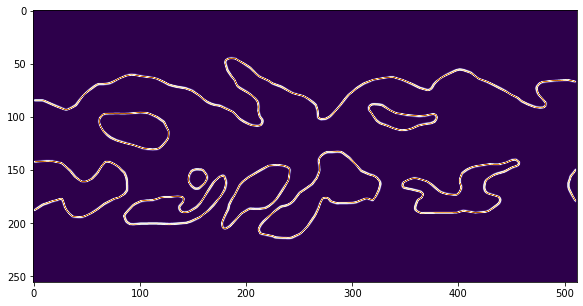

In [31]:
for img in data:
    plt.figure(figsize=(10, 5))
    plt.imshow(img, cmap='PuOr')

In [33]:
path_to_save = 'Tests/Fits/sign'
num_tries = 3
num_epochs = 5e+4

for img_num, img in tqdm(enumerate(data)):
    cur_path = os.path.join(path_to_save, f'img_{img_num+1}')
    os.makedirs(cur_path, exist_ok=True)
    for i in range(num_tries):
        img_data = ImageData(img, 'img')
        model = Net(image_list=[img_data], lr=1e-3)
        model.to(device)
        model.start_training(num_epochs=num_epochs, my_weight=0.1, need_save=False, need_plot=False)
        prediction_list = model.test_model()
        prediction = prediction_list[0]
        torch.save(model.state_dict(), os.path.join(cur_path,f'model_{img_num+1}_{i+1}.pth'))
        plt.figure(figsize=(20, 10))
        plt.subplot(1, 2, 1)
        plt.imshow(img, cmap='PuOr')
        plt.title('input')
        plt.subplot(1, 2, 2)
        plt.imshow(prediction.view(new_shape), cmap='PuOr')
        plt.title('prediction')
        plt.tight_layout()
        # add white background
        plt.savefig(os.path.join(cur_path, f'result_{img_num+1}_{i+1}.png'), bbox_inches='tight', pad_inches=0, facecolor='white')
        plt.close()

6it [2:33:11, 1531.87s/it]


KeyboardInterrupt: 

### Pretrain

NameError: name 'nn' is not defined

In [137]:
data_3d = [ImageData(img, 'img') for img in data]

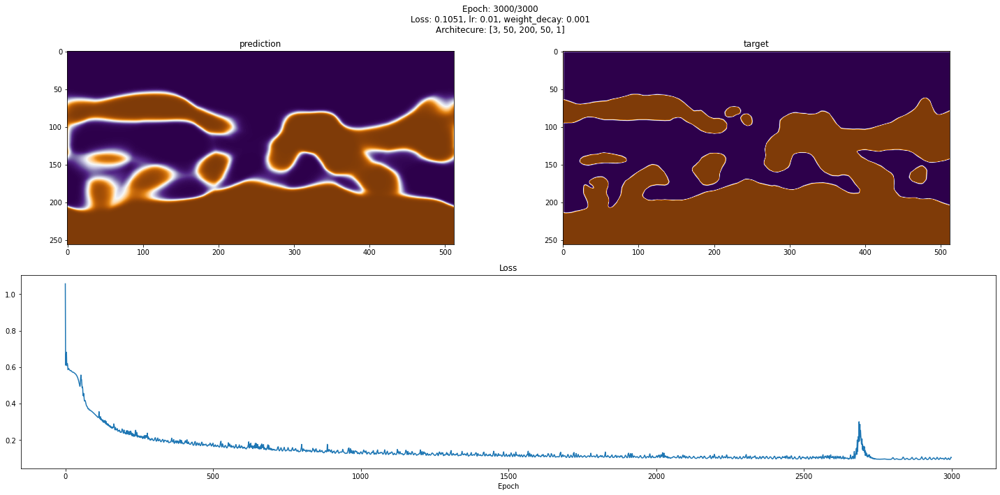

Epoch: 100%|██████████| 3000/3000 [01:00<00:00, 49.71it/s]


In [146]:
model = MSENet(img=data_3d[1], arch=[3, 50, 200, 50, 1], lr=1e-2, weight_decay=1e-3)
model.to(device)
model.train(num_epochs=3e+3, need_plot=True, need_save=False)

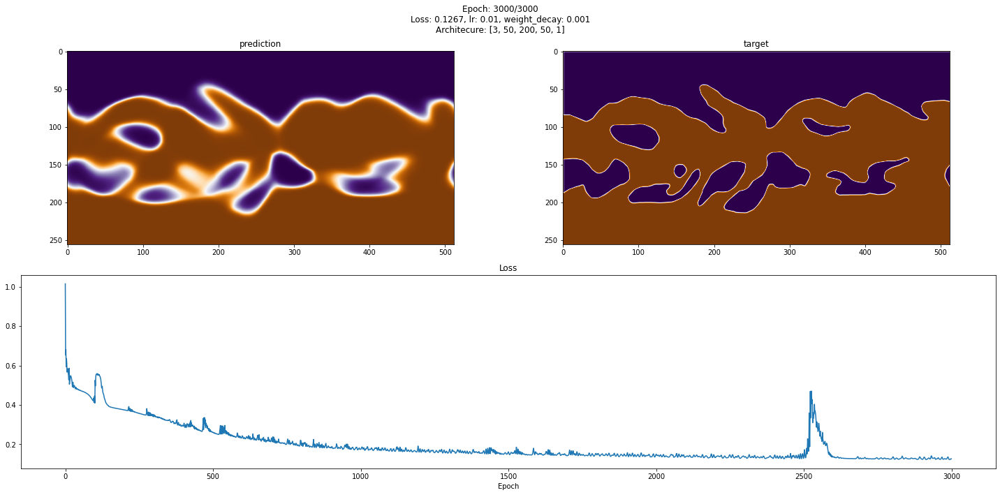

Epoch: 100%|██████████| 3000/3000 [01:59<00:00, 25.13it/s]


In [151]:
path_to_save = 'Tests/Fits/MSENet'
os.makedirs(path_to_save, exist_ok=True)

for i, img in enumerate(data_3d):
    model = MSENet(img=img, arch=[3, 50, 200, 50, 1], lr=1e-2, weight_decay=1e-3)
    model.to(device)
    model.train(num_epochs=3e+3, need_plot=True, need_save=False)
    torch.save(model.state_dict(), os.path.join(path_to_save, f'model_{i}.pth'))

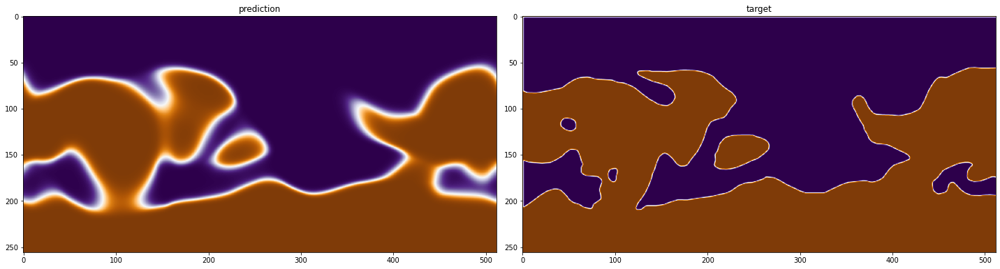

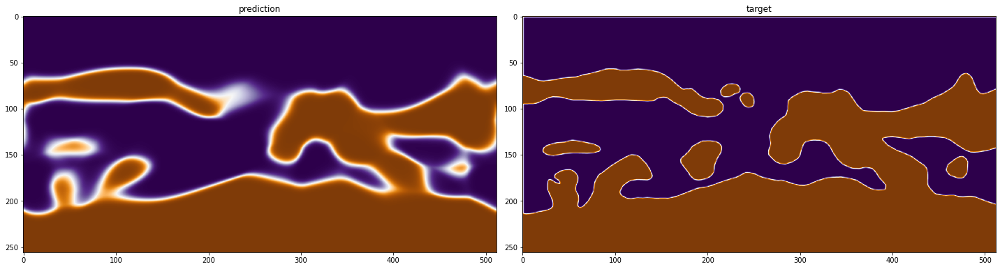

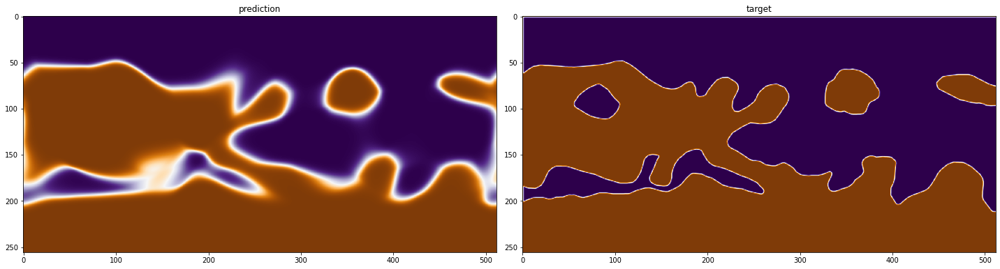

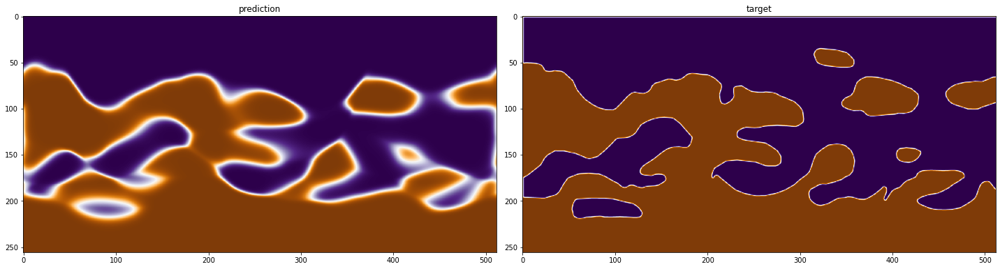

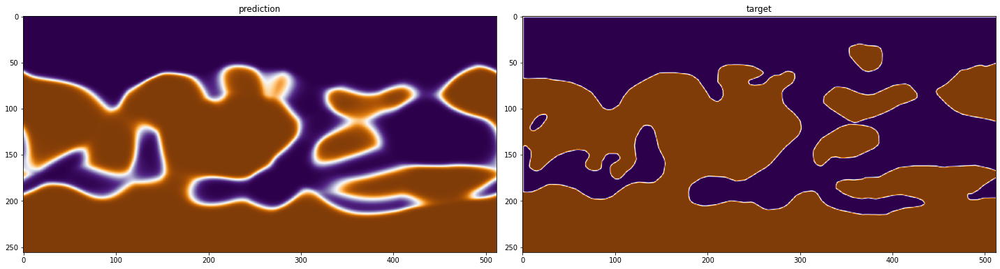

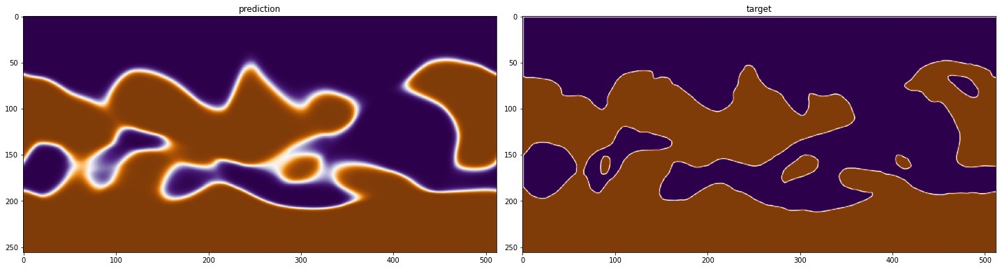

In [154]:
for x, weights in zip(data_3d[:-1], os.listdir(path_to_save)):
    model = MSENet(x, arch=[3, 50, 200, 50, 1], lr=1e-2, weight_decay=1e-3)
    model.to(device)
    model.load_state_dict(torch.load(os.path.join(path_to_save, weights)))
    prediction = model(x.data_3d.to(device))
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(prediction.view(new_shape).cpu().detach(), cmap='PuOr')
    plt.title('prediction')
    plt.subplot(1, 2, 2)
    plt.imshow(x.img_array, cmap='PuOr')
    plt.title('target')
    plt.tight_layout()
    plt.show()

## III

In [2]:
from scripts.model import Net

In [3]:
new_shape = (256, 512)
signs, filaments = [], []
for filename in os.listdir(path_to_data)[:7]:
    with fits.open(os.path.join(path_to_data, filename)) as hduls:
        sign = np.array(hduls[0].data == 7)[2:, 2:-10]
        filament = np.array(hduls[0].data == 8)
    sign = resize(sign.astype(float), new_shape, anti_aliasing=True)
    filament = resize(filament.astype(float), new_shape, anti_aliasing=True)
    sign = 2 * (sign - np.min(sign)) / (np.max(sign) - np.min(sign)) - 1
    filament = 2 * (filament - np.min(filament)) / (np.max(filament) - np.min(filament)) - 1
    signs.append(sign)
    filaments.append(ImageData(1-filament, 'img'))

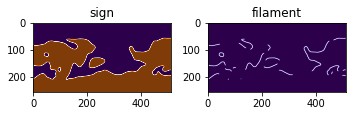

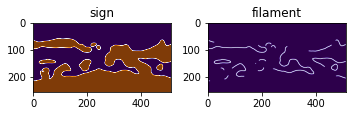

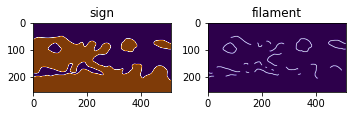

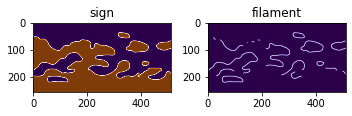

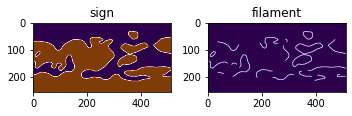

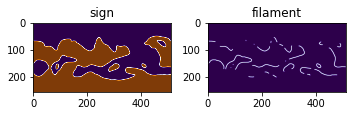

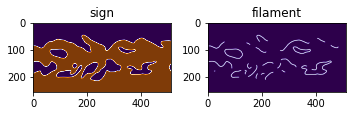

In [4]:
for s, f in zip(signs, filaments):
    plt.figure(figsize=(5, 3))
    plt.subplot(1, 2, 1)
    plt.imshow(s, cmap='PuOr')
    plt.title('sign')
    plt.subplot(1, 2, 2)
    plt.imshow(f.img_array, cmap='PuOr')
    plt.title('filament')
    plt.tight_layout()
    plt.show()

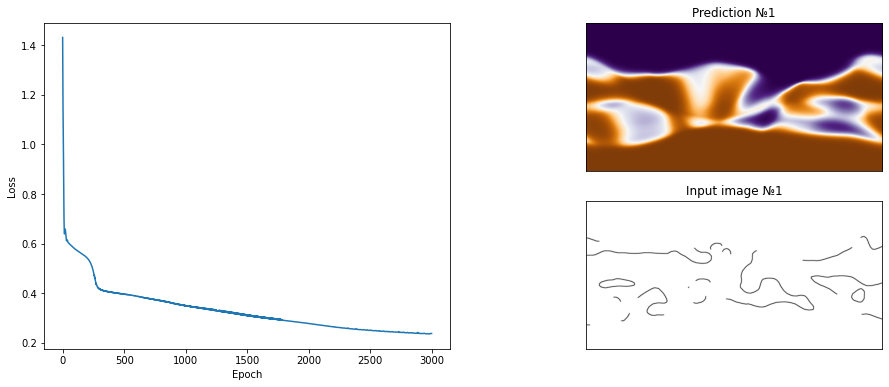

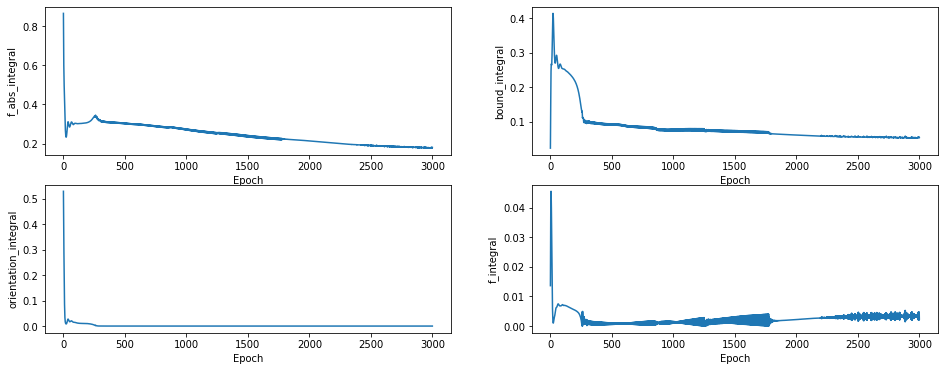

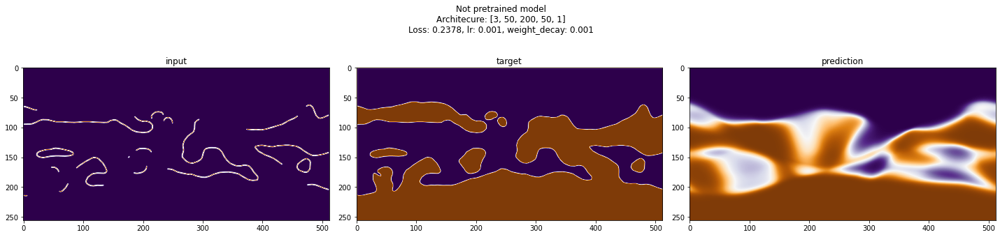

In [28]:
num_epochs = 3000

model = Net([filaments[1]], arch=[3, 50, 200, 50, 1], lr=1e-3, weight_decay=1e-3)
model.to(device)
# model.load_state_dict(torch.load(os.path.join(path_to_pretrained, weights)))
start_state = model.test_model()[0]
model.start_training(num_epochs=num_epochs, my_weight=0.1, need_save=False, need_plot=True)
prediction_pretrain = model.test_model()[0]
plt.figure(figsize=(20, 5))
plt.subplot(1, 3, 1)
plt.imshow(filaments[1].img_array, cmap='PuOr')
plt.title('input')
plt.subplot(1, 3, 2)
plt.imshow(signs[1], cmap='PuOr')
plt.title('target')
plt.subplot(1, 3, 3)
plt.imshow(prediction_pretrain.view(new_shape), cmap='PuOr')
plt.title('prediction')
plt.suptitle(f'Not pretrained model\nArchitecure: {model.arch}\nLoss: {model.loss_dict["loss"][-1]:.4f}, lr: {model.lr}, weight_decay: {model.weight_decay}\bEpoch: {num_epochs}')
plt.tight_layout()
plt.show()

C:\Users\waclo\AppData\Local\Temp\ipykernel_16108\3334394168.py:23: UserWarning: Glyph 8 ) missing from current font.
  plt.tight_layout()


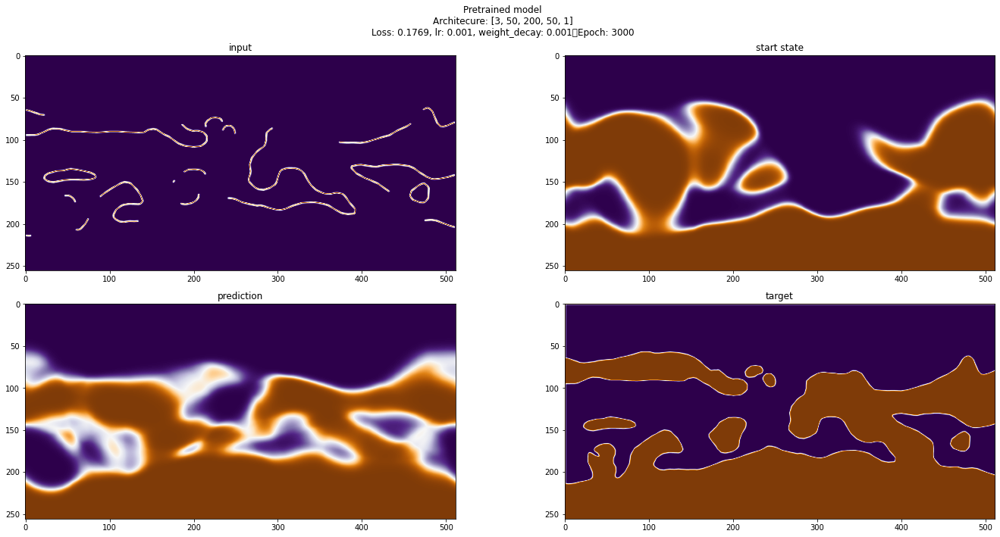

In [32]:
num_epochs = 3000

model = Net([filaments[1]], arch=[3, 50, 200, 50, 1], lr=1e-3, weight_decay=1e-3)
model.to(device)
model.load_state_dict(torch.load('Tests/Fits/MSENet/pretrained/model_0.pth'))
start_state = model.test_model()[0]
model.start_training(num_epochs=num_epochs, my_weight=0.1, need_save=False, need_plot=True)
prediction_pretrain = model.test_model()[0]
plt.figure(figsize=(20, 10))
plt.subplot(2, 2, 1)
plt.imshow(filaments[1].img_array, cmap='PuOr')
plt.title('input')
plt.subplot(2, 2, 2)
plt.imshow(start_state.view(new_shape), cmap='PuOr')
plt.title('start state')
plt.subplot(2, 2, 3)
plt.imshow(prediction_pretrain.view(new_shape), cmap='PuOr')
plt.title('prediction')
plt.subplot(2, 2, 4)
plt.imshow(signs[1], cmap='PuOr')
plt.title('target')
plt.suptitle(f'Pretrained model\nArchitecure: {model.arch}\nLoss: {model.loss_dict["loss"][-1]:.4f}, lr: {model.lr}, weight_decay: {model.weight_decay}\nEpoch: {num_epochs}')
plt.tight_layout()
plt.show()

In [ ]:
path_to_pretrained = 'Tests/Fits/MSENet/pretrained'
path_to_save = 'Tests/Fits/MSENet'
num_epochs = 5e+4
os.makedirs(path_to_save, exist_ok=True)

for i, weights in enumerate(os.listdir(path_to_pretrained)[1:]):
    # withg pretrain
    model = Net([filaments[i+1]], arch=[3, 50, 200, 50, 1], lr=1e-3, weight_decay=1e-3)
    model.to(device)
    model.load_state_dict(torch.load(os.path.join(path_to_pretrained, weights)))
    start_state = model.test_model()[0]
    model.start_training(num_epochs=num_epochs, my_weight=0.1, need_save=False, need_plot=False)
    prediction_pretrain = model.test_model()[0]
    torch.save(model.state_dict(), os.path.join(path_to_save, f'model_{i+1}_pretrained.pth'))
    # without pretrain
    model = Net([filaments[i+1]], arch=[3, 50, 200, 50, 1], lr=1e-3, weight_decay=1e-3)
    model.to(device)
    model.start_training(num_epochs=num_epochs, my_weight=0.1, need_save=False, need_plot=False)
    prediction = model.test_model()[0]
    torch.save(model.state_dict(), os.path.join(path_to_save, f'model_{i+1}_not_pretrained.pth'))
    # plot
    plt.figure(figsize=(20, 10))
    plt.subplot(2, 2, 1)
    plt.imshow(start_state.view(new_shape).cpu().detach(), cmap='PuOr')
    plt.title('start state (pretrained)')
    plt.subplot(2, 2, 2)
    plt.imshow(prediction_pretrain.view(new_shape).cpu().detach(), cmap='PuOr')
    plt.title('prediction (pretrained)')
    plt.subplot(2, 2, 3)
    plt.imshow(prediction.view(new_shape).cpu().detach(), cmap='PuOr')
    plt.title('prediction (not pretrained)')
    plt.subplot(2, 2, 4)
    plt.imshow(signs[i], cmap='PuOr')
    plt.title('target')
    plt.tight_layout()
    plt.savefig(os.path.join(path_to_save, f'result_{i+1}.png'), bbox_inches='tight', pad_inches=0, facecolor='white')
    plt.show()


# 6 Maps

In [4]:
path_to_pretrained = 'Tests/Fits/MSENet/pretrained'
path_to_save = 'Tests/Fits/MSENet/6Maps/not_pretrained'
num_epochs = 20000
num_tries = 5
os.makedirs(path_to_save, exist_ok=True)

## No Pretrain

In [5]:
for i in tqdm(range(len(filaments)-1)):
    for num_try in range(num_tries):
        model = Net([filaments[i+1]], arch=[3, 50, 200, 50, 1], lr=1e-3, weight_decay=1e-3)
        model.to(device)
        model.start_training(num_epochs=num_epochs, my_weight=0.1, need_save=False, need_plot=False)
        model.save_state_dict(os.path.join(path_to_save, f'model_{i+1}_{num_try+1}.pth'))
        prediction_pretrain = model.test_model()[0]
        plt.figure(figsize=(20, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(filaments[i+1].img_array, cmap='PuOr')
        plt.title('input')
        plt.subplot(1, 3, 3)
        plt.imshow(signs[i+1], cmap='PuOr')
        plt.title('target')
        plt.subplot(1, 3, 2)
        plt.imshow(prediction_pretrain.view(new_shape), cmap='PuOr')
        plt.title('prediction')
        plt.suptitle(f'Not pretrained model\nArchitecure: {model.arch}\nLoss: {model.loss_dict["loss"][-1]:.4f}, lr: {model.lr}, weight_decay: {model.weight_decay}\nEpoch: {num_epochs}')
        plt.tight_layout()
        plt.savefig(os.path.join(path_to_save, f'result_{i+1}_{num_try+1}.png'), bbox_inches='tight', pad_inches=0, facecolor='white')
        plt.close()

  0%|          | 0/6 [00:00<?, ?it/s]


RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call,so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.

## Pretrain

In [15]:
path_to_pretrained = 'Tests/Fits/MSENet/pretrained'
path_to_save = 'Tests/Fits/MSENet/6Maps/pretrained'
num_epochs = 10000
num_tries = 3
os.makedirs(path_to_save, exist_ok=True)

In [16]:
for i in tqdm(range(len(filaments)-1)):
    for num_try in range(num_tries):
        model = Net([filaments[i+1]], arch=[3, 50, 200, 50, 1], lr=1e-3, weight_decay=1e-3)
        model.to(device)
        model.load_state_dict(torch.load(os.path.join(path_to_pretrained, f'model_{i}.pth')))
        start_state = model.test_model()[0]
        model.start_training(num_epochs=num_epochs, my_weight=0.1, need_save=False, need_plot=False)
        model.save_state_dict(os.path.join(path_to_save, f'model_{i+1}_{num_try+1}.pth'))
        prediction_pretrain = model.test_model()[0]
        plt.figure(figsize=(20, 10))
        plt.subplot(2, 2, 1)
        plt.imshow(filaments[i+1].img_array, cmap='PuOr')
        plt.title('input')
        plt.subplot(2, 2, 2)
        plt.imshow(start_state.view(new_shape), cmap='PuOr')
        plt.title('start state')
        plt.subplot(2, 2, 3)
        plt.imshow(prediction_pretrain.view(new_shape), cmap='PuOr')
        plt.title('prediction')
        plt.subplot(2, 2, 4)
        plt.imshow(signs[i+1], cmap='PuOr')
        plt.title('target')
        plt.suptitle(f'Pretrained model\nArchitecure: {model.arch}\nLoss: {model.loss_dict["loss"][-1]:.4f}, lr: {model.lr}, weight_decay: {model.weight_decay}\nEpoch: {num_epochs}')
        plt.tight_layout()
        plt.savefig(os.path.join(path_to_save, f'result_{i+1}_{num_try+1}.png'), bbox_inches='tight', pad_inches=0, facecolor='white')
        plt.close()


100%|██████████| 6/6 [1:48:25<00:00, 1084.27s/it]


# 2D

In [4]:
path_to_save = 'Tests/Fits/MSENet/6Maps/pretained_weights_3d_08'
num_epochs = 10000
os.makedirs(path_to_save, exist_ok=True)

In [ ]:
model = Net([filaments[1]], mode='3d', arch=[3, 50, 200, 50, 1], lr=1e-3, weight_decay=1e-3)
model.to(device)
start_state = model.test_model()[0]
model.start_training(num_epochs=50000, my_weight=0.1, need_save=False, need_plot=True)


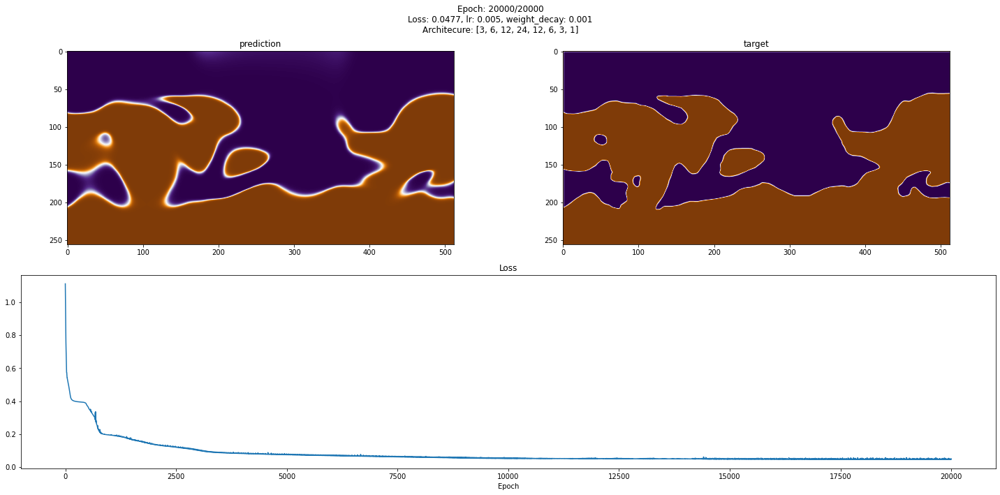

Epoch: 100%|██████████| 20000/20000 [03:01<00:00, 110.37it/s]


In [38]:
model = MSENet(img=ImageData(signs[0], 'img'), mode='3d', arch=[3, 6, 12, 24, 12, 6, 3, 1], lr=5e-3, weight_decay=1e-3)
model.to(device)
model.train(num_epochs=20000, need_plot=True, need_save=False)


In [42]:
os.makedirs('Tests/Fits/MSENet/6Maps/pretained_weights_3d', exist_ok=True)
torch.save(model.state_dict(), 'Tests/Fits/MSENet/6Maps/pretained_weights_3d/model_0.pth')

In [39]:
from scripts.helper import plot_3d_tensor

plot_3d_tensor(model.data, model.forward(model.data.to(device)).view(-1, 1).cpu().detach().squeeze()) 

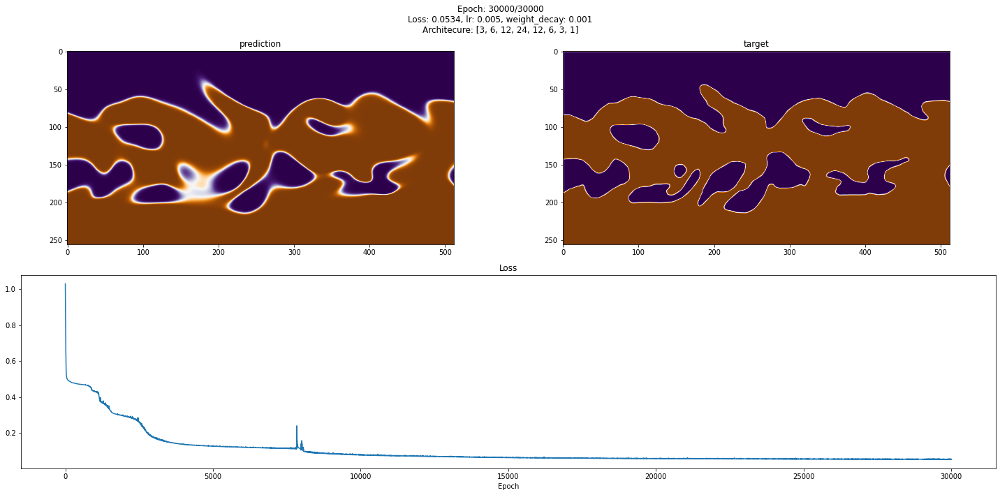

Epoch: 100%|██████████| 30000/30000 [04:32<00:00, 110.23it/s]


In [3]:
num_epochs = 30000
path_to_save = 'Tests/Fits/MSENet/6Maps/pretained_weights_3d'
os.makedirs(path_to_save, exist_ok=True)
for i, img in enumerate(signs[1:]):
    model = MSENet(img=ImageData(img, 'img'), mode='3d', arch=[3, 6, 12, 24, 12, 6, 3, 1], lr=5e-3, weight_decay=1e-3)
    model.to(device)
    model.train(num_epochs=num_epochs, need_plot=True, need_save=False)
    torch.save(model.state_dict(), os.path.join(path_to_save, f'model_{i+1}.pth'))

In [8]:
path_to_weights = 'Tests/Fits/MSENet/6Maps/pretained_weights_3d'
path_to_save = 'Tests/Fits/MSENet/6Maps/pretained_weights_3d/pretraiend'
num_epochs=50000
os.makedirs(path_to_save, exist_ok=True)

for i, img in enumerate(filaments[1:]):
    model = Net([img], mode='3d', arch=[3, 6, 12, 24, 12, 6, 3, 1], lr=5e-3, weight_decay=1e-3)
    model.to(device)
    model.load_state_dict(torch.load(os.path.join(path_to_weights, f'model_{i}.pth')))
    start_state = model.test_model()[0]
    model.start_training(num_epochs=num_epochs, my_weight=0.1, need_save=False, need_plot=False)
    prediction_pretrain = model.test_model()[0]
    model.save_state_dict(os.path.join(path_to_save, f'model_{i+1}.pth'))
    plt.figure(figsize=(20, 10))
    plt.subplot(2, 2, 1)
    plt.imshow(img.img_array, cmap='PuOr')
    plt.title('input')
    plt.subplot(2, 2, 2)
    plt.imshow(start_state.view(new_shape), cmap='PuOr')
    plt.title('start state')
    plt.subplot(2, 2, 3)
    plt.imshow(prediction_pretrain.view(new_shape), cmap='PuOr')
    plt.title('prediction')
    plt.subplot(2, 2, 4)
    plt.imshow(signs[i+1], cmap='PuOr')
    plt.title('target')
    plt.suptitle(f'Pretrained model\nArchitecure: {model.arch}\nLoss: {model.loss_dict["loss"][-1]:.4f}, lr: {model.lr}, weight_decay: {model.weight_decay}\nEpochs: {num_epochs}')
    plt.tight_layout()
    plt.savefig(os.path.join(path_to_save, f'result_{i+1}.png'), bbox_inches='tight', pad_inches=0, facecolor='white')
    plt.close()
